## Project-4 Advanced Lane Finding

In [1]:
# Import Dependencies
import os
import cv2
import glob
import pickle
import numpy as np
from moviepy.editor import VideoFileClip
import matplotlib.pyplot as plt
from matplotlib.image import imread, imsave
%matplotlib inline

## Step-1: Camera Caliberation


#### 1. Find Chessboard Corners

##### Input: 

Grayscale Images

##### Output: 

ret = True/False, 

Corners = Array of corner values as (x,y)

#### 2. Draw Chessboard Corners

##### Input: 

Original Image

Number of Rows and Columns (row,col)

Corners and ret values from "1".


##### Output: 

Image with Corners Plotted on top

#### 3. Do Camera Caliberation

##### Input:

Object Points

Image Points

Shape of Grayscale Image

##### Output:

ret = True/False

mtx => Camera Matrix

dist => array of values

rvecs => Rotational Vector

tvecs => Translational Vector

Total Number of Images:  20
Corners found on Images:  17
Percentage of Caliberation Images used: 85.0 %


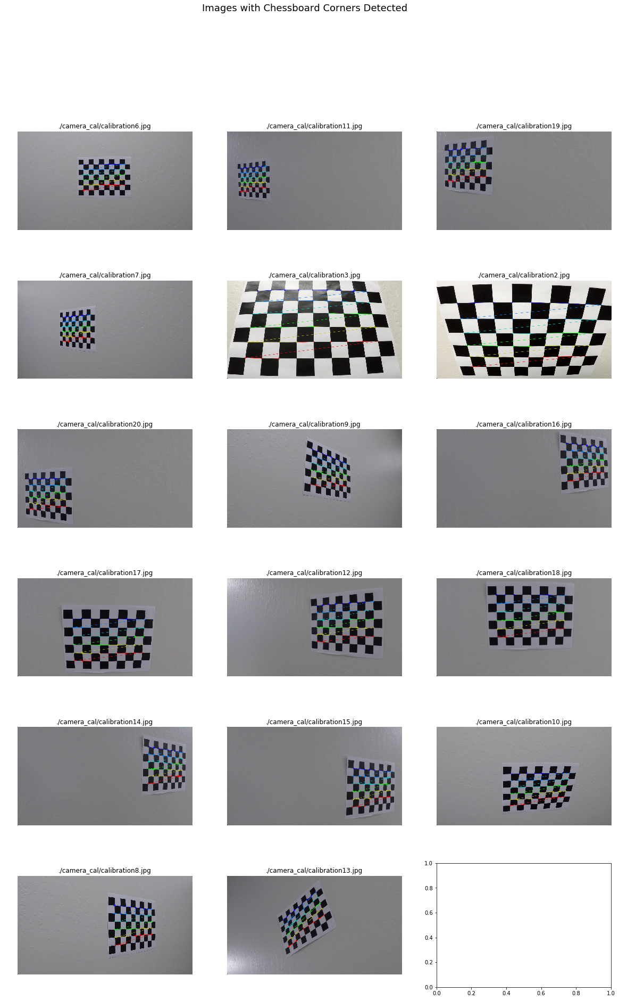

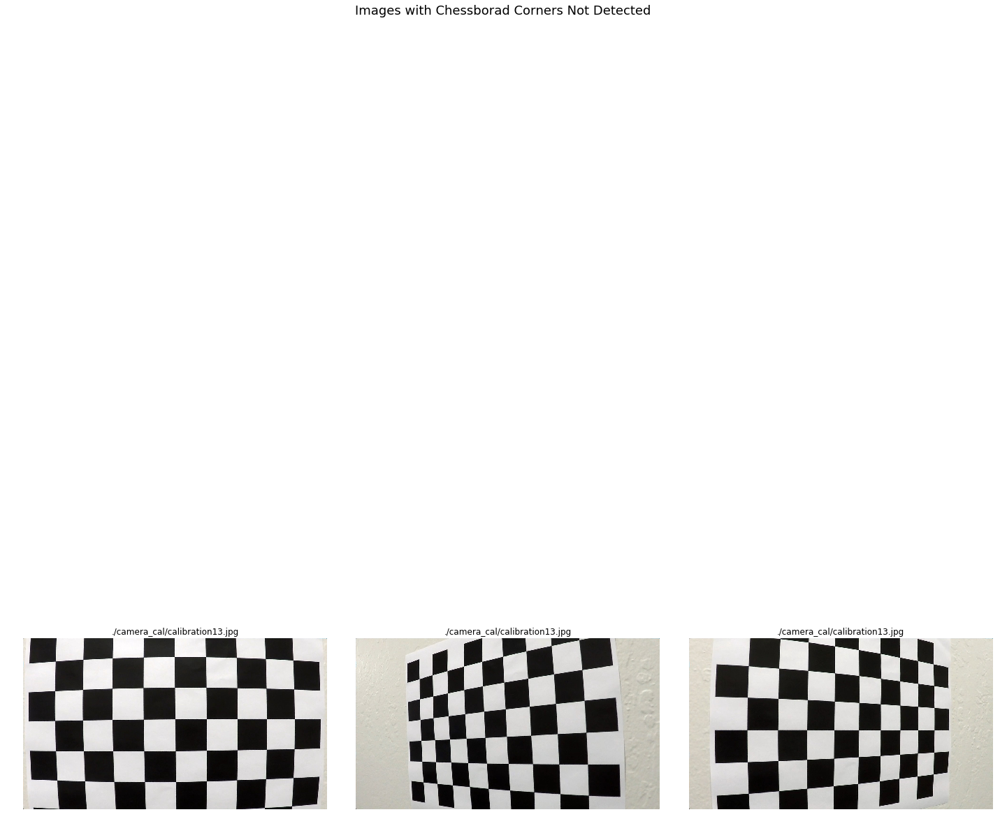

In [2]:
# Step-1: Camera Caliberation
# Read All Chessboard Images and Find Corners

# Define corners in image
rows = 9
cols = 6

# # Map 2D Coordinates of Image to 3D coordinates on Chessboard
# 3-D Points in real world
# (x,y,0)
objPoints = []

# 2-D points in the image
# (x,y)
imgPoints = []

# Array to store names of images in which corners were not found
no_corners = []

# Create Object Points
# Since, cols = 8, rows = 6 in chessboard image
objp = np.zeros(shape=(rows * cols,3), dtype=np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Read in all Images
images = glob.glob('./camera_cal/calibration*.jpg')

# Figure Size for Plotting Images
fig, ax = plt.subplots(nrows=6, ncols=3, figsize=(20,30))
#plt.subplots_adjust(wspace=None, hspace=None)
#plt.tight_layout()
i = 0
j = 0

for image in images:   
    # Read the Image File
    img = imread(image)
    
    # Conver Image to Grayscale Image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Find Chessboard Corners
    ret, corners = cv2.findChessboardCorners(gray, (rows,cols), None)
    
    # If ret=True, append images and objectpoints
    if ret == True:
        imgPoints.append(corners)
        objPoints.append(objp)
        
        # Draw Corners on Chessboard Images
        img = cv2.drawChessboardCorners(img, (8,6), corners, ret)       
        
        # Plot Images with Chessboard Corners Detected
        ax[i,j].imshow(img)
        ax[i,j].set_axis_off()
        ax[i,j].set_title(image)
        #ax[i,j].set_aspect('equal')
        
        j += 1
        
        if j == 3:
            i += 1
            j = 0
    else:
        no_corners.append(image)

plt.suptitle('Images with Chessboard Corners Detected', fontsize=18)

        
# Plot Images in which the Corners were not Found
fig1, ax1 = plt.subplots(nrows=1, ncols=3, figsize=(20,30))
plt.suptitle('Images with Chessborad Corners Not Detected', fontsize=18)
plt.tight_layout()
k = 0
for img in no_corners:
    im = imread(img)
    ax1[k].imshow(im)
    ax1[k].set_axis_off()
    ax1[k].set_title(image)
    #ax1[k].set_aspect('equal')
    k += 1


# Print Overall Dataset Performance
print('Total Number of Images: ',len(images))
print ('Corners found on Images: ',len(imgPoints))
print('Percentage of Caliberation Images used: {} %'.format((len(imgPoints)/len(images)) * 100))

In [3]:
# Camera Caliberation

# Read in a Sample Image
img = imread('./camera_cal/calibration1.jpg')

img_size = (img.shape[1],img.shape[0])

# Caliberate Camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img_size, None, None)

## Step-2: Image Undistortion

#### 1. Undistort Image:

##### Inputs:

img => Input Image

mtx => Camera Matrix

dist => Distortion Coefficients

##### Output:

dst => Matrix

In [4]:
# Function to Undistort Images
def undistort_image(image):
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    return dst

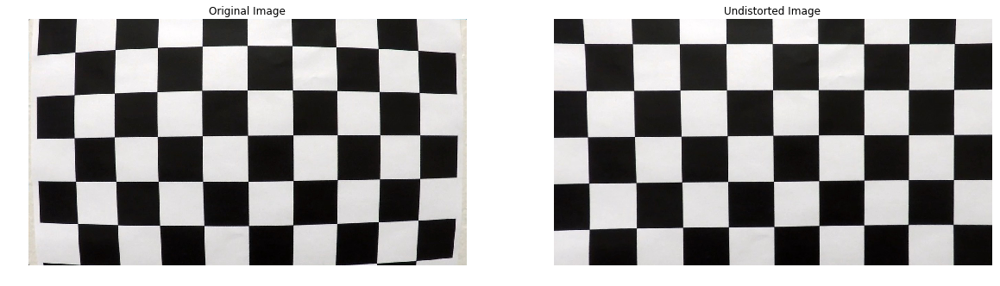

In [5]:
# Check Undistortion on Input Image
undistorted_img = undistort_image(img)

# Plot Original and Undistorted Images
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,30))
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].set_axis_off()

ax[1].imshow(undistorted_img)
ax[1].set_title('Undistorted Image')
ax[1].set_axis_off()

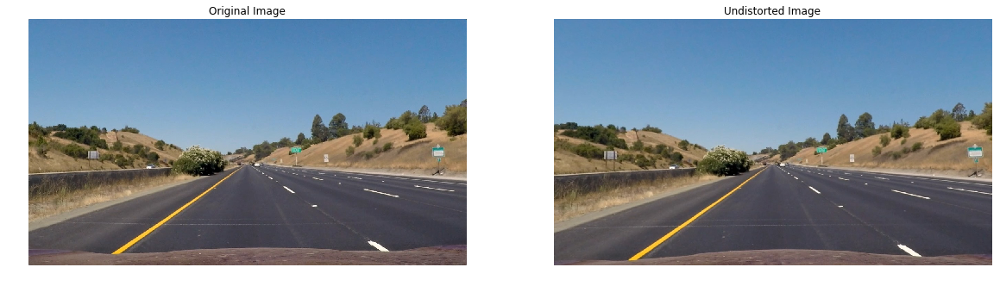

In [6]:
# Check Undistortion on Road Images
img = imread('./test_images/straight_lines1.jpg')

img_size = (img.shape[1],img.shape[0])

# Caliberate Camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, img_size, None, None)

# Check Undistortion on Input Image
undistorted_img = undistort_image(img)

# Plot Original and Undistorted Images
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(20,30))
ax[0].imshow(img)
ax[0].set_title('Original Image')
ax[0].set_axis_off()

ax[1].imshow(undistorted_img)
ax[1].set_title('Undistorted Image')
ax[1].set_axis_off()

## Finding Region of Interest

In [7]:
# Function to Unwarp Image
def warp_image(img, src, dst):
    # Get Image Height and Width
    height = img.shape[0]
    width = img.shape[1]
    
    # Get Perspective Transform Matrix
    M = cv2.getPerspectiveTransform(src, dst)
    
    # Get inverse Perspective Tranform Matrix
    Minv = cv2.getPerspectiveTransform(dst,src)
    
    # Warp the Images to get a Bird's Eye View of the Lane
    warped_image = cv2.warpPerspective(img, M, (width, height), flags = cv2.INTER_LINEAR)
    return warped_image, M, Minv

In [8]:
# Get Height and Width of Undistorted Image
height = undistorted_img.shape[0]
width = undistorted_img.shape[1]

# Define Source and Destination points for Transform
src = np.float32([(570,470),
                  (722,470), 
                  (220,720), 
                  (1110,720)])

dst = np.float32([(320,1),
                  (920,1),
                  (320, 720),
                  (920, 720)])

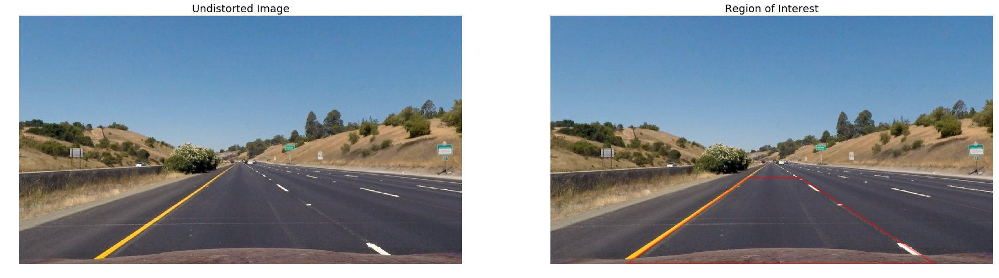

In [9]:
# Get the Undistorted Image and Plot it along with the selected region of Interest
gray = cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2GRAY)

# Array of Points depicting the Quadrilateral for Lane Lines
x_cord = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y_cord = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]

# Plot Unwarped Image with Original Image
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.set_axis_off()
ax1.set_title('Undistorted Image',fontsize=18)

ax2.imshow(undistorted_img)
ax2.plot(x_cord, y_cord, color='r', alpha=0.4, linewidth=3, solid_capstyle='round', zorder=2)
ax2.set_ylim([height,0])
ax2.set_xlim([0,width])
ax2.set_axis_off()
ax2.set_title('Region of Interest', fontsize=18)

## Step-4: Apply Color and Gradient Threshold

### 1. Check Colorspace that provides the Best Representation of Lane Lines

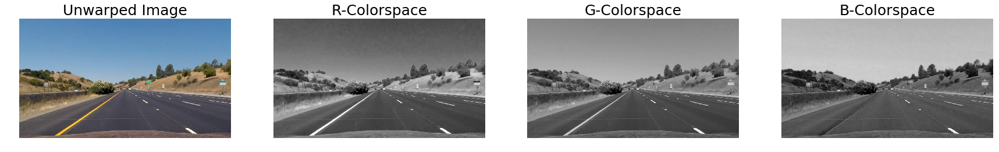

In [10]:
# RGB Colorspace
def img2rgb(img):
    R = img[:,:,0]
    G = img[:,:,1]
    B = img[:,:,2]
    return R,G,B

r, g, b = img2rgb(undistorted_img)

fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(r, cmap='gray')
ax2.set_axis_off()
ax2.set_title('R-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(g, cmap='gray')
ax3.set_axis_off()
ax3.set_title('G-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(b, cmap='gray')
ax4.set_axis_off()
ax4.set_title('B-Colorspace', fontsize=25)

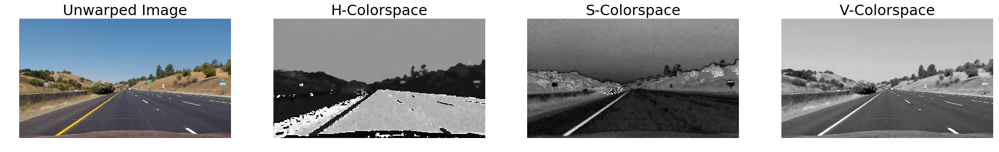

In [11]:
# RGB to HSV Colorspace
def rgb2hsv(img):
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    H = hsv[:,:,0]
    S = hsv[:,:,1]
    V = hsv[:,:,2]
    return H, S, V

h, s, v = rgb2hsv(undistorted_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(h, cmap='gray')
ax2.set_axis_off()
ax2.set_title('H-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(s, cmap='gray')
ax3.set_axis_off()
ax3.set_title('S-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(v, cmap='gray')
ax4.set_axis_off()
ax4.set_title('V-Colorspace', fontsize=25)

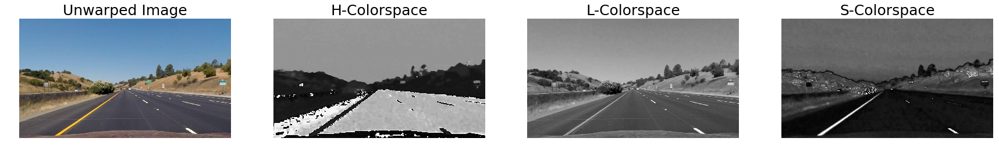

In [12]:
# RGB to HLS Colorspace
def rgb2hls(img):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    return H, L, S

h, l, s = rgb2hls(undistorted_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(h, cmap='gray')
ax2.set_axis_off()
ax2.set_title('H-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(l, cmap='gray')
ax3.set_axis_off()
ax3.set_title('L-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(s, cmap='gray')
ax4.set_axis_off()
ax4.set_title('S-Colorspace', fontsize=25)

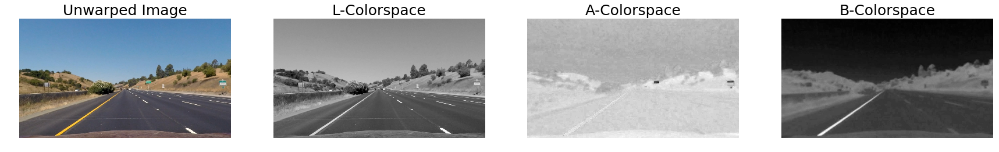

In [13]:
# RGB to LAB Colorspace
def rgb2lab(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    L = lab[:,:,0]
    A = lab[:,:,1]
    B = lab[:,:,2]
    return L, A, B

l, a, b = rgb2lab(undistorted_img)


fig, (ax1,ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=4, figsize=(30,20))
ax1.imshow(undistorted_img)
ax1.set_axis_off()
ax1.set_title('Unwarped Image', fontsize=25)

# H-colorspace
ax2.imshow(l, cmap='gray')
ax2.set_axis_off()
ax2.set_title('L-Colorspace', fontsize=25)

# S-colorspace
ax3.imshow(a, cmap='gray')
ax3.set_axis_off()
ax3.set_title('A-Colorspace', fontsize=25)

# V-colorspace
ax4.imshow(b, cmap='gray')
ax4.set_axis_off()
ax4.set_title('B-Colorspace', fontsize=25)

### 2. Check the Gradient Thresholding Methods

In [14]:
# Sobel Gradient Threshold in "x" and "y" orientation
def sobelThresholdImage(img, orient= 'x', thresh_Sobel = (0,255)):
    if orient== 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
        #sobel_abs = np.absolute(sobel_x)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    sobel_abs = np.absolute(sobel)
    
    scaled_sobel = np.uint8(255*sobel_abs/np.max(sobel_abs))
    
    # Sobel Threshold
    sob_threshold = np.zeros_like(scaled_sobel)
    sob_threshold[(scaled_sobel >= thresh_Sobel[0]) & (scaled_sobel <= thresh_Sobel[1])] = 1
    
    return sob_threshold

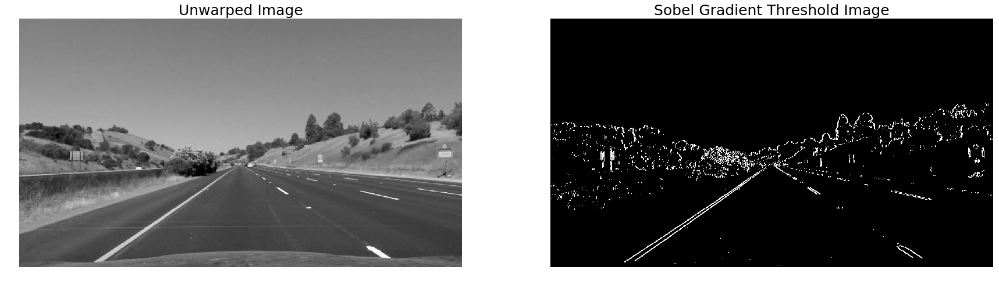

In [15]:
# Test Sobel Gradient Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(gray, cmap='gray')
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelThresholdImage(gray, thresh_Sobel=(30,250)), cmap='gray')
ax2.set_title('Sobel Gradient Threshold Image', fontsize=25)
ax2.set_axis_off()

In [16]:
# Function to Calculate Magnitude of the Gradients
def sobelMagThresh(image, sobel_kernel=1, mag_thresh=(25, 255)):
    # Calculate gradient magnitude
    #gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = image
    # Take the gradient in x and y separately
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # 3) Calculate the magnitude
    sobel_mag = np.sqrt((sobel_x * sobel_x) + (sobel_y * sobel_y))
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    #scaled_sobel = np.uint8(255*sobel_mag/np.max(sobel_mag))
    
    # 5) Create a binary mask where mag thresholds are met
    sob_mag = np.zeros_like(sobel_mag)
    sob_mag[(sobel_mag >= mag_thresh[0]) & (sobel_mag <= mag_thresh[1])] = 1
    # Apply threshold
    return sob_mag

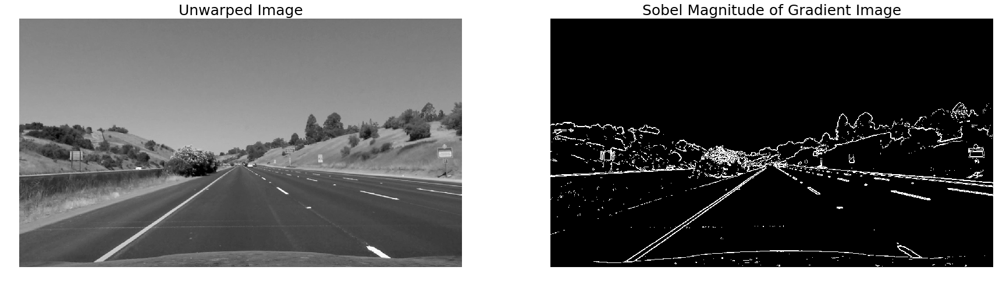

In [17]:
# Test Sobel Gradient Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(gray, cmap='gray')
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelMagThresh(gray, mag_thresh=(30,200)), cmap='gray')
ax2.set_title('Sobel Magnitude of Gradient Image', fontsize=25)
ax2.set_axis_off()

In [18]:
# Function to get Gradient Direction
def sobelDirThreshold(image, sobel_kernel=3, dir_thresh=(0, np.pi/2)):
    # Calculate gradient direction
    #gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    gray = image
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the x and y gradients
    sobelx_abs = np.absolute(sobel_x)
    sobely_abs = np.absolute(sobel_y)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction_of_gradient = np.arctan2(sobely_abs,sobelx_abs)
    
    # Create a binary mask where direction thresholds are met
    sob_dir = np.zeros_like(direction_of_gradient)
    sob_dir[(direction_of_gradient >= dir_thresh[0]) & (direction_of_gradient <= dir_thresh[1])] = 1
    
    return sob_dir

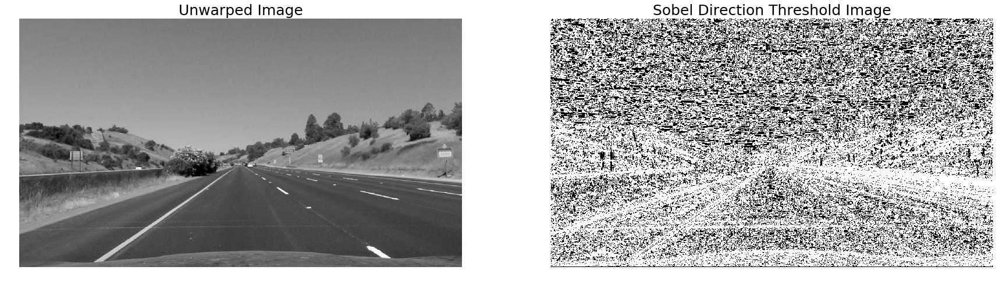

In [19]:
# Test Sobel Gradient Output
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(gray, cmap='gray')
ax1.set_title('Unwarped Image', fontsize=25)
ax1.set_axis_off()

ax2.imshow(sobelDirThreshold(gray, dir_thresh=(np.pi/6, np.pi/2)), cmap='gray')
ax2.set_title('Sobel Direction Threshold Image', fontsize=25)
ax2.set_axis_off()

## Combine Color and Gradient Thresholds

In [20]:
# Combined Threshold: Threshold + Direction
def combined_Thresh_Dir(img):
    
    # Undistort the Input Image to remove any issues due to Camera
    img = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert the Image to Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Get Height and Width of the Image
    height, width = gray.shape
    
    # Get the Gradient Threshold and Direction of Gradients
    thresh = sobelThresholdImage(gray, 'x', thresh_Sobel=(30, 255))
    dirct = sobelDirThreshold(gray, dir_thresh=(np.pi/6, np.pi/2))
    #dirct = sobelDirThreshold(gray, dir_thresh=(0, 0.10))
    
    # Combine the Sobel Threshold and Direction of Gradients
    combined_sobel = ((thresh == 1) & (dirct == 1))
    
    # We saw above that  R and G Colorspaces define the Yellow color pretty nicely.
    # So, combinng R and G colorspaces to get the Yellow Color
    rg_thresh = (150, 150)
    R, G, B = img2rgb(img)
    yellow_lane = (R > rg_thresh[0]) & (G > rg_thresh[1])
    
    # HLS Color Threshold
    H, L, S = rgb2hls(img)
    # Using S-Channel for Detecting Bright Yellow and White Lanes
    s_thresh = (100, 255)
    yellow_white_lanes = (S > s_thresh[0]) & (S <= s_thresh[1])
    
    # Using L Channel to be thresholded to avoid darkness in image due to shadows
    l_thresh = (120, 255)
    light = (L > l_thresh[0]) & (L <= l_thresh[1])
    
    # Combine all Colorspaces with Thresholds
    combined_colorspace = np.zeros_like(R)
    combined_colorspace[(yellow_lane & light) & (yellow_white_lanes | combined_sobel)] = 1
    
    # Apply Region of Interest Mask
    mask = np.zeros_like(combined_colorspace)
    region_of_interest_vertices = np.array([[0,height-1], [width/2, int(0.5*height)], [width-1, height-1]], dtype=np.int32)
    
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded_image = cv2.bitwise_and(combined_colorspace, mask)
    
    return thresholded_image

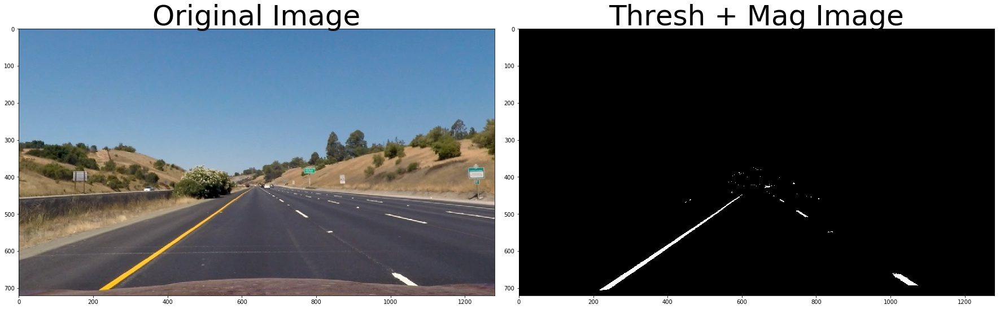

In [21]:
# Test Color Thresholding
img1 = imread('./test_images/straight_lines1.jpg')

thresholded_image = combined_Thresh_Dir(img1)
img2 = cv2.undistort(img1, mtx, dist, None, mtx)

# Plot the 2 images side by side
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img2)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(thresholded_image, cmap='gray')
ax2.set_title('Thresh + Mag Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

### Warp Image

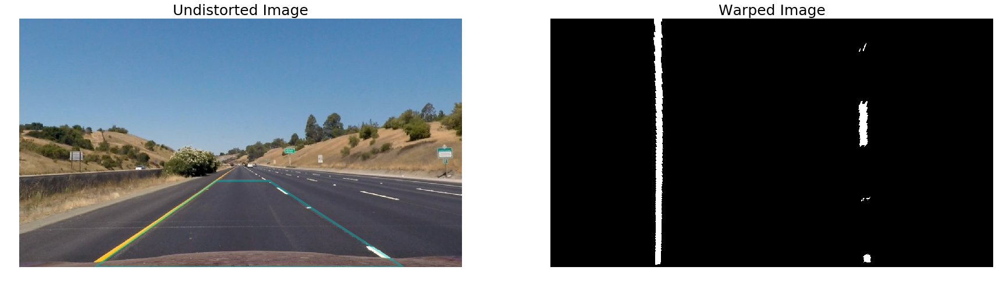

In [22]:
# Get the Warped Image and Plot it
warped_img, M, Minv = warp_image(thresholded_image, src, dst)

# Apply Gaussian Blur to Warped Image
#gauss = cv2.GaussianBlur(gray,(kernel_size,kernel_size),0)
#gray = cv2.cvtColor(undistorted_img, cv2.COLOR_RGB2GRAY)
#kernel_size = 5

# Array of Points depicting the Quadrilateral for Lane Lines
x_cord = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y_cord = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]

# Plot Unwarped Image with Original Image
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(30,20))
ax1.imshow(img2)
ax1.plot(x_cord, y_cord, color='c', alpha=0.4, linewidth=4, solid_capstyle='round', zorder=2)
ax1.set_ylim([height,0])
ax1.set_xlim([0,width])
ax1.set_axis_off()
ax1.set_title('Undistorted Image', fontsize=25)

ax2.imshow(warped_img, cmap='gray')
ax2.set_axis_off()
ax2.set_title('Warped Image',fontsize=25)

### Lane Finding from Warped Image using Peaks in Histogram

307 908


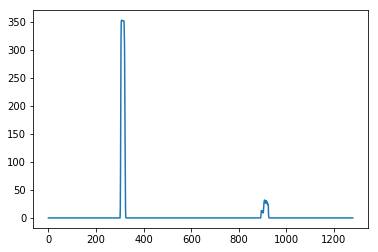

In [23]:
# Code Ref.: Udacity

num = int(warped_img.shape[0] / 2)
histogram = np.sum(warped_img[num:,:], axis=0)

# Peak in the first half indicates the likely position of the left lane
half_width = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:half_width])

# Peak in the second half indicates the likely position of the right lane
rightx_base = np.argmax(histogram[half_width:]) + half_width

print(leftx_base, rightx_base)
plt.plot(histogram)

### Using Sliding Window Method to Fit a Polynomial

Num Rows:  720
Window Height:  72


(720, 0)

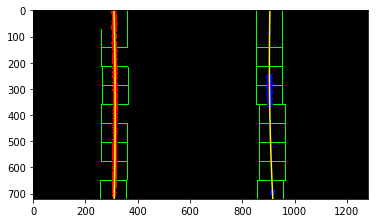

In [24]:
# Code Ref.: Udacity

out_img = np.dstack((warped_img, warped_img, warped_img))*255

non_zeros = warped_img.nonzero()
nonZeros_y = non_zeros[0]
nonZeros_x = non_zeros[1]

num_windows = 10
num_rows = warped_img.shape[0]
print('Num Rows: ', num_rows)
window_height = np.int(num_rows/num_windows)
print('Window Height: ', window_height)
window_half_width = 50
min_pixels = 100

left_coordinates = []
right_coordinates = []

for window in range(num_windows):
    y_max = num_rows - window * window_height
    y_min = num_rows - (window+1) * window_height
    
    left_x_min = leftx_base - window_half_width
    left_x_max = leftx_base + window_half_width
        
    cv2.rectangle(out_img, (left_x_min, y_min), (left_x_max, y_max), [0,255,0],2)
    
    good_left_window_coordinates = ((nonZeros_x >= left_x_min) & (nonZeros_x <= left_x_max) & (nonZeros_y >= y_min) & (nonZeros_y <= y_max)).nonzero()[0]
    left_coordinates.append(good_left_window_coordinates)
    
    if len(good_left_window_coordinates) > min_pixels:
        leftx_base = np.int(np.mean(nonZeros_x[good_left_window_coordinates]))
    
    right_x_min = rightx_base - window_half_width
    right_x_max = rightx_base + window_half_width
    
    cv2.rectangle(out_img, (right_x_min, y_min), (right_x_max, y_max), [0,255,],2)
    
    good_right_window_coordinates = ((nonZeros_x >= right_x_min) & (nonZeros_x <= right_x_max) & (nonZeros_y >= y_min) & (nonZeros_y <= y_max)).nonzero()[0]
    right_coordinates.append(good_right_window_coordinates)
        
    if len(good_right_window_coordinates) > min_pixels:
        rightx_base = np.int(np.mean(nonZeros_x[good_right_window_coordinates]))
        
left_coordinates = np.concatenate(left_coordinates)
right_coordinates = np.concatenate(right_coordinates)

out_img[nonZeros_y[left_coordinates], nonZeros_x[left_coordinates]] = [255,0,0]
out_img[nonZeros_y[right_coordinates], nonZeros_x[right_coordinates]] = [0,0,255]

leftx = nonZeros_x[left_coordinates]
lefty = nonZeros_y[left_coordinates]

polyfit_left = np.polyfit(lefty, leftx, 2)

rightx = nonZeros_x[right_coordinates]
righty = nonZeros_y[right_coordinates]

polyfit_right = np.polyfit(righty, rightx, 2)

y_points = np.linspace(0, num_rows-1, num_rows)

left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]

right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]

# Plot the Line using Polynomial
plt.imshow(out_img)
plt.plot(left_x_predictions, y_points, color='yellow')
plt.plot(right_x_predictions, y_points, color='yellow')
plt.xlim(0, warped_img.shape[1])
plt.ylim(warped_img.shape[0],0)

### Search for Lanes in the Margins and Visualize them

In [25]:
margin = 50
output_img = np.dstack((warped_img, warped_img, warped_img))*255

# Initializing variables 
left_XVal_pred = polyfit_left[0]*nonZeros_y**2 + polyfit_left[1]*nonZeros_y + polyfit_left[2]
left_coord = ((nonZeros_x >= left_XVal_pred - margin) & (nonZeros_x <= left_XVal_pred + margin)).nonzero()[0]

right_XVal_pred = polyfit_right[0]*nonZeros_y**2 + polyfit_right[1]*nonZeros_y + polyfit_right[2]
right_coord = ((nonZeros_x >= right_XVal_pred - margin) & (nonZeros_x <= right_XVal_pred + margin)).nonzero()[0]

output_img[nonZeros_y[left_coord], nonZeros_x[left_coord]] = [255,0,0]
output_img[nonZeros_y[right_coord], nonZeros_x[right_coord]] = [0,0,255]

x_left = nonZeros_x[left_coord]
y_left = nonZeros_y[left_coord]

polyfit_left = np.polyfit(y_left, x_left, 2)

x_right = nonZeros_x[right_coord]
y_right = nonZeros_y[right_coord]

polyfit_right = np.polyfit(y_right, x_right, 2)

y_points = np.linspace(0, num_rows-1, num_rows)

left_XVal_pred = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]

right_XVal_pred = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]

window_img = np.zeros_like(out_img)

left_line_window_1 = np.array(np.transpose(np.vstack([left_XVal_pred - margin, y_points])))

left_line_window_2 = np.array(np.flipud(np.transpose(np.vstack([left_XVal_pred + margin, y_points]))))

left_line_points = np.vstack((left_line_window_1, left_line_window_2))

cv2.fillPoly(window_img, np.int_([left_line_points]), [0,255, 0])

right_line_window_1 = np.array(np.transpose(np.vstack([right_XVal_pred - margin, y_points])))

right_line_window_2 = np.array(np.flipud(np.transpose(np.vstack([right_XVal_pred + margin, y_points]))))

right_line_points = np.vstack((right_line_window_1, right_line_window_2))

cv2.fillPoly(window_img, np.int_([right_line_points]), [0,255, 0])

result = cv2.addWeighted(output_img, 1, window_img, 0.3, 0)

(720, 0)

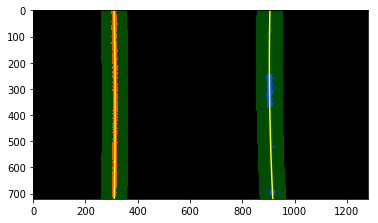

In [26]:
# Plot the Lane Lines
plt.imshow(result)
plt.plot(left_XVal_pred, y_points, color='yellow')
plt.plot(right_XVal_pred, y_points, color='yellow')
plt.xlim(0, warped_img.shape[1])
plt.ylim(warped_img.shape[0],0)

### Measure Radius of Curvature

In [27]:
# Compute Radius of Road
def radius_Of_Curvature(prediction_values):
    # Values: Ref. Udacity
    # Meters per Pixel in Y Dimension
    y_metersPerPixel = 30/720
    
    # Meters per Pixel in X Dimension
    x_metersPerPixel = 3.7/700

    y_points = np.linspace(0, num_rows-1, num_rows)
    y_eval = np.max(y_points)

    # Fit Polynomial to X and Y Values
    fit_cr = np.polyfit(y_points * y_metersPerPixel, prediction_values * x_metersPerPixel, 2)
    
    curve_radius = ((1 + (2 * fit_cr[0] * y_eval * y_metersPerPixel + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    return curve_radius

In [28]:
# Test Radius of Curve Function
left_curve_radius = radius_Of_Curvature(left_XVal_pred)
right_curve_radius = radius_Of_Curvature(right_XVal_pred)

average_curve_radius = (left_curve_radius + right_curve_radius)/2

radius_of_curvature = "Radius of curvature: %.2f m" % average_curve_radius

print(radius_of_curvature)

# Compute Curvature Offset from Center
lane_center = (right_XVal_pred[719] + left_XVal_pred[719])/2
x_metersPerPixel = 3.7/700

center_offset_pixels = abs(img_size[0]/2 - lane_center)

center_offset_mtrs = x_metersPerPixel * center_offset_pixels

offset_string = "Center offset: %.2f m" % center_offset_mtrs

print(offset_string)

Radius of curvature: 4136.04 m
Center offset: 0.14 m


### Fill in the Lane Lines

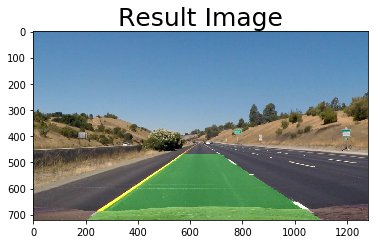

In [29]:
out_img = np.dstack((warped_img, warped_img, warped_img))*255

y_points = np.linspace(0, num_rows-1, num_rows)

left_line_window = np.array(np.transpose(np.vstack([left_XVal_pred, y_points])))

right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_XVal_pred, y_points]))))

line_points = np.vstack((left_line_window, right_line_window))

cv2.fillPoly(out_img, np.int_([line_points]), [0,255, 0])

img_size = (img1.shape[1], img1.shape[0])

warped_image = cv2.warpPerspective(out_img, Minv, img_size , flags=cv2.INTER_LINEAR)

result = cv2.addWeighted(img, 1, warped_image, 0.3, 0)

plt.imshow(result)
plt.title('Result Image', fontsize=25)

Till now we have tested the individual components for the pipeline. Now, it's time to combine all these things into one function and form a pipeline.

## Final Pipeline

In [30]:
# Some global variables
polyfit_left=None
polyfit_right=None

previous_left_lanes = []
previous_right_lanes = []

mean_difference_between_lines = 0

In [31]:
# Function to get the predicition of future values for lane lines based on past lane line values
def laneLinePredictions(nonZeros_x, nonZeros_y, leftLaneCoordinates, rightLaneCoordinates, num_rows):

    leftx = nonZeros_x[leftLaneCoordinates]
    lefty = nonZeros_y[leftLaneCoordinates]
    
    # If no pixels were found return None
    if ((leftx.size == 0) or (lefty.size == 0)):
        return None, None

    # Fit the polynomial
    polyfit_left = np.polyfit(lefty, leftx, 2)

    rightx = nonZeros_x[rightLaneCoordinates]
    righty = nonZeros_y[rightLaneCoordinates]
    
    # If no pixels were found return None
    if ((rightx.size == 0) or (righty.size == 0)):
        return None, None

    # Fit the polynomial
    polyfit_right = np.polyfit(righty, rightx, 2)

    # If no pixels were found return None
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # Generate the lane lines from the polynomial fit
    left_x_predictions = polyfit_left[0]*y_points**2 + polyfit_left[1]*y_points + polyfit_left[2]
    right_x_predictions = polyfit_right[0]*y_points**2 + polyfit_right[1]*y_points + polyfit_right[2]
    
    return left_x_predictions, right_x_predictions

In [32]:
# Function to Initially Search for Lane Lines
# This is the first search, hence from scratch
def firstSearch(warped_image):
    non_zeros = warped_image.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped_image.shape[0]
    
    num = int(warped_image.shape[0] / 2)
    
    histogram = np.sum(warped_image[num:,:], axis=0)

    half_width = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:half_width])
    rightx_base = np.argmax(histogram[half_width:]) + half_width

    num_windows = 10
    window_height = np.int(num_rows/num_windows)
    window_half_width = 50

    min_pixels = 100

    left_coordinates = []
    right_coordinates = []

    for window in range(num_windows):
        y_max = num_rows - window*window_height
        y_min = num_rows - (window+1)* window_height

        left_x_min = leftx_base - window_half_width
        left_x_max = leftx_base + window_half_width

        good_left_window_coordinates = ((non_zeros_x >= left_x_min) & (non_zeros_x <= left_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        left_coordinates.append(good_left_window_coordinates)

        if len(good_left_window_coordinates) > min_pixels:
            leftx_base = np.int(np.mean(non_zeros_x[good_left_window_coordinates]))

        right_x_min = rightx_base - window_half_width
        right_x_max = rightx_base + window_half_width

        good_right_window_coordinates = ((non_zeros_x >= right_x_min) & (non_zeros_x <= right_x_max) & (non_zeros_y >= y_min) & (non_zeros_y <= y_max)).nonzero()[0]
        right_coordinates.append(good_right_window_coordinates)

        if len(good_right_window_coordinates) > min_pixels:
            rightx_base = np.int(np.mean(non_zeros_x[good_right_window_coordinates]))

    left_coordinates = np.concatenate(left_coordinates)
    right_coordinates = np.concatenate(right_coordinates)
    
    left_x_predictions, right_x_predictions = laneLinePredictions(nonZeros_x = non_zeros_x, nonZeros_y = non_zeros_y, leftLaneCoordinates = left_coordinates, rightLaneCoordinates = right_coordinates, num_rows = num_rows)
    return left_x_predictions, right_x_predictions

In [33]:
# Ref. Udacity
# Function to Compute Averaged Lane Line using Previous Good Frames
def averagedLaneLine(previous_lines, new_line):   
    # Number of frames to average over
    num_frames = 12
    
    if new_line is None:
        # No line was detected
        
        if len(previous_lines) == 0:
            # If there are no previous lines, return None
            return previous_lines, None
        else:
            # Else return the last line
            return previous_lines, previous_lines[-1]
    else:
        if len(previous_lines) < num_frames:
            # we need at least num_frames frames to average over
            previous_lines.append(new_line)
            return previous_lines, new_line
        else:
            # average over the last num_frames frames
            previous_lines[0:num_frames-1] = previous_lines[1:]
            previous_lines[num_frames-1] = new_line
            new_line = np.zeros_like(new_line)
            for i in range(num_frames):
                new_line += previous_lines[i]
            new_line /= num_frames
            return previous_lines, new_line

In [34]:
# Final Pipeline
def pipeline(img):
    # Global Variables to Store Polynomial Coefficients of the Lane Detected in the Previous Frame
    global polyfit_right
    global polyfit_left
    global previous_right_lanes
    global previous_left_lanes
    
    # global variable which contains running average of the mean difference between left and right lanes
    global mean_difference_between_lines
    
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])
    
    # Get Image Threshold
    thresholded_image = combined_Thresh_Dir(img)
    
    # Get Warped Image
    warped_image = cv2.warpPerspective(thresholded_image, M, img_size , flags=cv2.INTER_LINEAR)
    
    out_img = np.dstack((warped_image, warped_image, warped_image))*255
    
    non_zeros = warped_image.nonzero()
    non_zeros_y = non_zeros[0]
    non_zeros_x = non_zeros[1]
    
    num_rows = warped_image.shape[0]
    y_points = np.linspace(0, num_rows-1, num_rows)
    
    # If there are not Coefficients from Left or Right Polyfit, it is a first search for coefficients
    if (polyfit_left is None) or (polyfit_right is None):  
        first_search = True
        left_x_predictions, right_x_predictions = firstSearch(warped_image)
    
    # Else, we search for coefficients within the Margin of 100 pixels
    else:
        first_search = False
        margin = 100
        left_x_predictions = polyfit_left[0]*non_zeros_y**2 + polyfit_left[1]*non_zeros_y + polyfit_left[2]
        left_coordinates = ((non_zeros_x >= left_x_predictions - margin) & (non_zeros_x <= left_x_predictions + margin)).nonzero()[0]

        right_x_predictions = polyfit_right[0]*non_zeros_y**2 + polyfit_right[1]*non_zeros_y + polyfit_right[2]
        right_coordinates = ((non_zeros_x >= right_x_predictions - margin) & (non_zeros_x <= right_x_predictions + margin)).nonzero()[0]
        
        left_x_predictions, right_x_predictions = laneLinePredictions(nonZeros_x = non_zeros_x, nonZeros_y = non_zeros_y, leftLaneCoordinates = left_coordinates, rightLaneCoordinates = right_coordinates, num_rows = num_rows)
    
    if (left_x_predictions is None or right_x_predictions is None):
        if not first_search:
            left_x_predictions, right_x_predictions = firstSearch(warped_image)
            
    bad_lanes = False
            
    if (left_x_predictions is None or right_x_predictions is None):
        bad_lanes = True
    else:
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        
        if mean_difference_between_lines == 0:
            mean_difference_between_lines = mean_difference
        
        if (mean_difference < 0.7*mean_difference_between_lines or mean_difference > 1.3*mean_difference_between_lines):
            bad_lanes = True
            if not first_search:
                left_x_predictions, right_x_predictions = firstSearch(warped_image)
                if (left_x_predictions is None or right_x_predictions is None):
                    bad_lanes = True
                else:
                    mean_difference = np.mean(right_x_predictions - left_x_predictions)
                    if (mean_difference < 0.7*mean_difference_between_lines or mean_difference > 1.3*mean_difference_between_lines):
                        bad_lanes = True
                    else:
                        bad_lanes = False
        else:
            bad_lanes = False
            
    if bad_lanes:
        polyfit_left = None
        polyfit_right = None
        if len(previous_left_lanes) == 0 and len(previous_right_lanes) == 0:
            return img
        else:
            left_x_predictions = previous_left_lanes[-1]
            right_x_predictions = previous_right_lanes[-1]
    else:
        previous_left_lanes, left_x_predictions = averagedLaneLine(previous_left_lanes, left_x_predictions)
        previous_right_lanes, right_x_predictions = averagedLaneLine(previous_right_lanes, right_x_predictions)
        mean_difference = np.mean(right_x_predictions - left_x_predictions)
        mean_difference_between_lines = 0.9*mean_difference_between_lines + 0.1*mean_difference
    
    left_line_window = np.array(np.transpose(np.vstack([left_x_predictions, y_points])))
    right_line_window = np.array(np.flipud(np.transpose(np.vstack([right_x_predictions, y_points]))))
    
    # compute the radius of curvature
    left_curve_rad = radius_Of_Curvature(left_x_predictions)
    right_curve_rad = radius_Of_Curvature(right_x_predictions)
    average_curve_rad = (left_curve_rad + right_curve_rad)/2
    curvature_string = "Radius of Curvature: %.2f m" % average_curve_rad
    
    # compute the offset from the center
    lane_center = (right_x_predictions[num_rows-1] + left_x_predictions[num_rows-1])/2
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    center_offset_pixels = abs(img_size[0]/2 - lane_center)
    center_offset_mtrs = xm_per_pix*center_offset_pixels
    offset_string = "Center offset: %.2f m" % center_offset_mtrs
    
    poly_points = np.vstack([left_line_window, right_line_window])
    
    cv2.fillPoly(out_img, np.int_([poly_points]), [0,255, 0])
    
    unwarped = cv2.warpPerspective(out_img, Minv, img_size , flags=cv2.INTER_LINEAR)

    result = cv2.addWeighted(img, 1, unwarped, 0.3, 0)
    
    cv2.putText(result,curvature_string , (100, 90), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    cv2.putText(result, offset_string, (100, 150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), thickness=2)
    
    return result

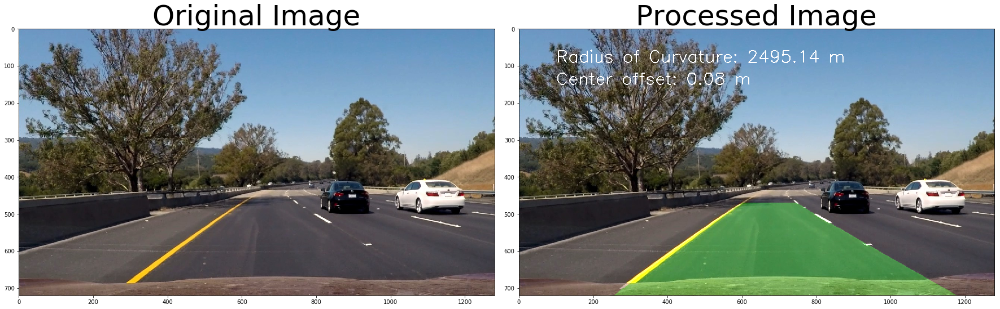

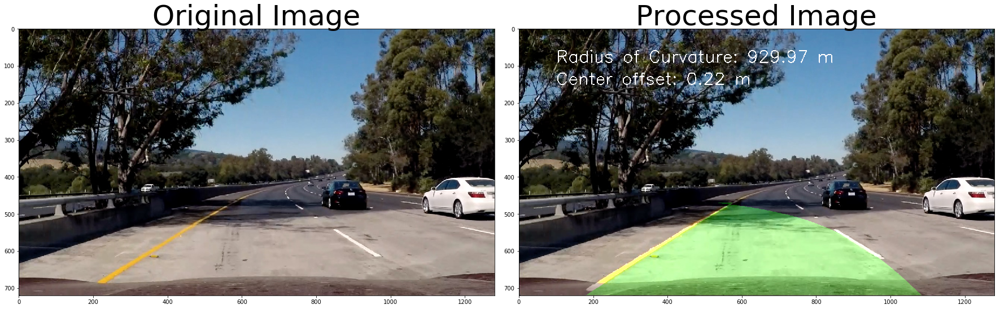

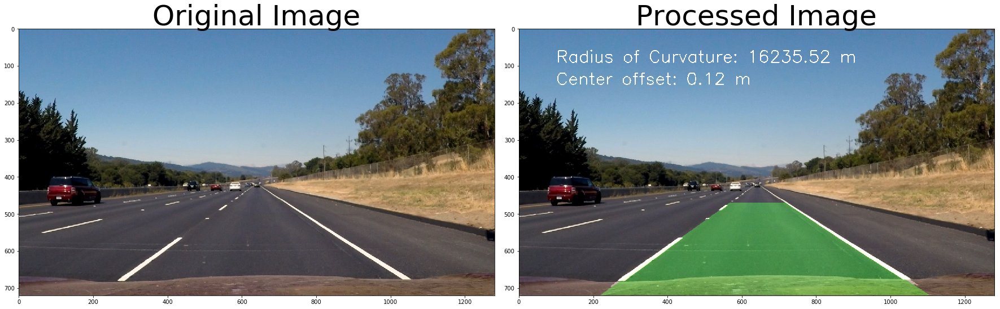

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


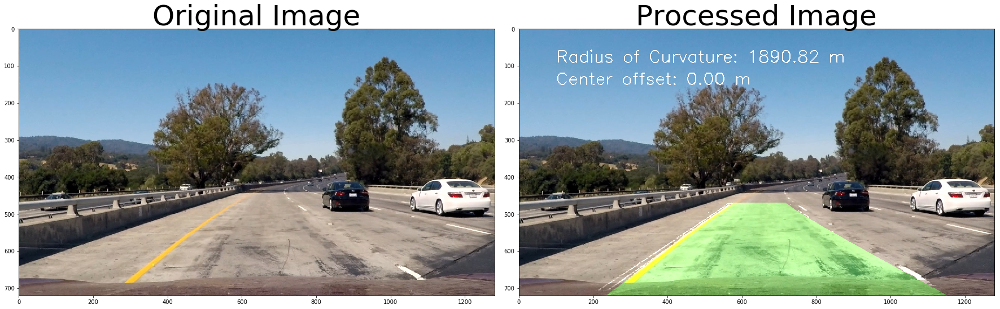

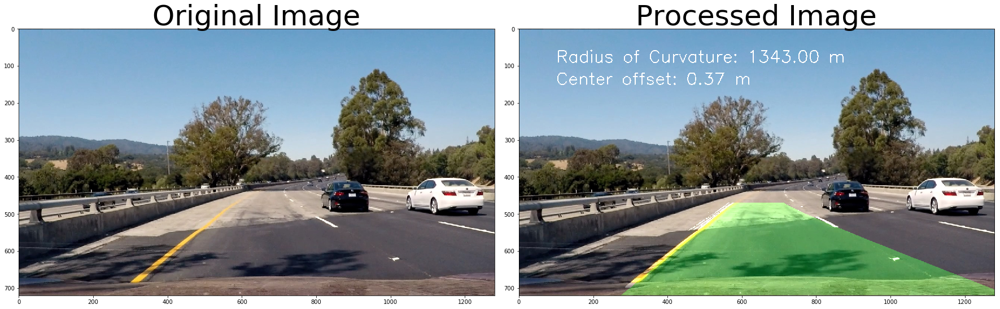

In [35]:
# Test the Pipeline
#img = imread('./test_images/test6.jpg')

#mean_difference_between_lines = 0

images = glob.glob('./test_images/*.jpg')

for img in images:
    img = imread(img)
    # Apply pipeline
    processed = pipeline(img)
    
    # Plot the 2 images
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    fig.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(processed, cmap='gray')
    ax2.set_title('Processed Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Testing Pipeline on Videos

In [36]:
# Testing Pipeline on Project Video

mean_difference_between_lines = 0

output_file = './Output_Videos/ProjectVideoOutput.mp4'
clip1 = VideoFileClip("./testVideos/project_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video ./Output_Videos/ProjectVideoOutput.mp4
[MoviePy] Writing video ./Output_Videos/ProjectVideoOutput.mp4


100%|█████████▉| 1260/1261 [03:38<00:00,  5.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./Output_Videos/ProjectVideoOutput.mp4 

CPU times: user 4min 4s, sys: 4.17 s, total: 4min 8s
Wall time: 3min 39s


In [37]:
# Testing Pipeline on Challenge Video

mean_difference_between_lines = 0

output_file = './Output_Videos/ChallengeVideoOutput.mp4'
clip1 = VideoFileClip("./testVideos/challenge_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video ./Output_Videos/ChallengeVideoOutput.mp4
[MoviePy] Writing video ./Output_Videos/ChallengeVideoOutput.mp4


100%|██████████| 485/485 [01:22<00:00,  5.92it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./Output_Videos/ChallengeVideoOutput.mp4 

CPU times: user 1min 31s, sys: 1.95 s, total: 1min 33s
Wall time: 1min 23s


In [38]:
# Testing Pipeline on Harder Challenge Video

mean_difference_between_lines = 0

output_file = './Output_Videos/HarderChallengeOutput.mp4'
clip1 = VideoFileClip("./testVideos/harder_challenge_video.mp4")
white_clip = clip1.fl_image(pipeline)
%time white_clip.write_videofile(output_file, audio=False)

[MoviePy] >>>> Building video ./Output_Videos/HarderChallengeOutput.mp4
[MoviePy] Writing video ./Output_Videos/HarderChallengeOutput.mp4


100%|█████████▉| 1199/1200 [04:02<00:00,  4.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./Output_Videos/HarderChallengeOutput.mp4 

CPU times: user 4min 32s, sys: 4.12 s, total: 4min 36s
Wall time: 4min 4s
